# 1. Setup and imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
from PIL import Image
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings('ignore', message="Column .* isn't present in data. Skipping it.")

import tensorflow as tf

from garbage.garbage_classifier import GarbageClassifier
from monitor import MultiClassVisionModelDriftMonitor
from utils import list_jpg_files, apply_covariate_shift_to_images, create_image_dataset

2024-04-24 01:26:20.553129: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
model_path = '../models/'
trained_model = tf.saved_model.load(model_path)

In [4]:
BATCH_SIZE = 16
CLASSES = ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']

classifier = GarbageClassifier(CLASSES, BATCH_SIZE)

In [5]:
# Read reference path file for monitoring
reference_path = '../datasets/kaggle_dataset2/images/reference_images.parquet'

df_reference = pd.read_parquet(reference_path)
df_reference.head()

,0,1,2,3,4,5,6,7,8,9,...,954,955,956,957,958,959,target,prediction,train_prediction_score,train_class
0,0.150386,1.341476,1.931756,0.377753,1.939039,0.000000,0.378690,0.012093,-0.001577,1.261342,...,1.995067,-0.003127,-0.004489,-0.011944,-0.024568,0.000000,0,2,1.000000,cardboard
1,1.022634,0.041749,0.352246,0.292197,0.213194,-0.014693,2.176312,0.204771,0.000000,-0.039669,...,0.047053,0.062801,0.000000,0.000000,0.187267,-0.006762,0,1,0.998810,cardboard
2,0.722389,-0.005933,4.571489,0.272215,0.054854,-0.004688,-0.005650,0.417597,0.011024,0.750703,...,-0.042815,0.007109,0.000000,-0.027004,0.142219,-0.002244,0,1,0.999976,cardboard
3,0.000000,0.006708,0.300107,-0.031435,-0.023401,0.237997,0.814762,0.141663,0.242236,0.111127,...,0.145492,0.000000,0.008742,-0.013203,-0.033580,0.034314,0,0,0.999934,cardboard
4,0.562770,0.123506,2.286933,4.059822,-0.067646,0.084846,0.058184,-0.015615,0.066877,-0.020352,...,-0.029623,0.000000,0.000000,-0.067732,-0.000076,0.000000,0,1,0.925552,cardboard


In [6]:
# Instantiate monitoring class
index_to_class = {0: 'cardboard', 1: 'glass', 2: 'metal', 3: 'paper', 4: 'plastic', 5: 'trash'}
model_monitor = MultiClassVisionModelDriftMonitor(index_to_class, df_reference.iloc[:, :40], df_reference.iloc[:, :960])

# 2. Select and process images to test model monitoring functions

In [7]:
images_directory = '../datasets/kaggle_dataset2/images/'

all_files = list_jpg_files(images_directory)

standard_images_paths = random.sample(all_files, 500)
drifted_images_paths = random.sample(all_files, 500)

In [8]:
# Modify lighting of original images to test embedding drifting
output_directory = '../datasets/kaggle_dataset2/drifted_images/'

apply_covariate_shift_to_images(output_directory, drifted_images_paths)

In [9]:
drifted_images_paths = list_jpg_files(output_directory)

In [10]:
standard_images_set = create_image_dataset(standard_images_paths)
shifted_images_set = create_image_dataset(drifted_images_paths)

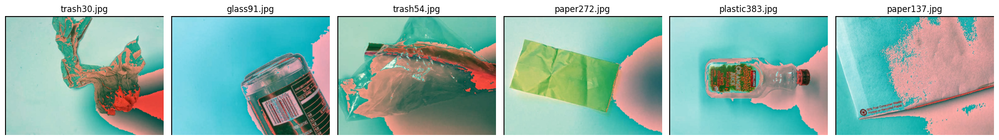

In [11]:
def plot_images_from_paths(image_paths, rows=1, cols=6, figsize=(20, 20)):
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = axes.flatten()
    
    for ax, img_path in zip(axes, image_paths):
        with Image.open(img_path) as img:
            ax.imshow(img)
            ax.set_title(img_path.split('/')[-1])
            ax.axis('off')

    for ax in axes[len(image_paths):]:
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

plot_images_from_paths(drifted_images_paths[:6])

# 3. Monitoring reports with Evidently: Embedding and Target Drift

## Embedding drift using images modified

In [13]:
shifted_images_embeddings = classifier.save_training_embeddings(shifted_images_set)
shifted_images_embeddings.head()

38/38 ━━━━━━━━━━━━━━━━━━━━ 11s 283ms/step


,0,1,2,3,4,5,6,7,8,9,...,950,951,952,953,954,955,956,957,958,959
0,1.851933,-0.030510,0.133555,0.013722,1.764070,1.706729,1.569223,0.052100,3.965689,2.320680,...,0.843504,0.069373,0.055852,0.607556,1.513683,1.244836,0.002145,0.274440,0.018676,0.294689
1,0.479767,1.227047,3.340214,0.488091,2.334520,0.011514,-0.000991,0.254128,0.000000,0.172547,...,-0.007564,0.132595,0.000000,0.679609,0.237910,0.256112,0.046616,-0.007022,0.000000,0.183518
2,0.948339,0.352756,0.720542,-0.014187,2.033274,-0.007364,0.014466,0.544239,0.000000,0.572194,...,0.141913,-0.012109,0.000000,0.898923,0.980830,2.352400,0.000000,0.000348,0.003759,0.200648
3,2.433210,-0.022434,2.245646,0.215774,2.559701,-0.032585,-0.001306,-0.019983,0.000000,0.617048,...,0.168643,0.275295,0.301868,1.711960,1.383331,0.062964,0.000000,0.307786,-0.019586,2.874285
4,0.046864,1.155405,1.805446,1.539962,2.638753,-0.006172,0.200279,0.050855,0.000000,0.179532,...,0.000000,-0.011279,0.000000,0.729393,0.035019,0.008457,0.000000,-0.003237,-0.011075,0.040840


In [14]:
embedding_drift_shifted = model_monitor.run_embeddings_drift_report('small_subset', df_reference.iloc[:, :960], shifted_images_embeddings)

In [15]:
embedding_drift_shifted

The drift score successfully suggest that the embeddings have changed

In [16]:
embedding_drift_shifted.save_html("./embedding_drift_data_shifted.html")

## Embedding drift using standard images

In [17]:
standard_images_embeddings = classifier.save_training_embeddings(standard_images_set)
standard_images_embeddings.head()

16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 260ms/step


,0,1,2,3,4,5,6,7,8,9,...,950,951,952,953,954,955,956,957,958,959
0,-0.011847,1.598949,0.995565,-0.005270,-0.048261,-0.007447,0.111311,-0.019819,0.014954,0.272171,...,0.097915,-0.044454,0.000000,0.510294,-0.074927,-0.020548,0.000000,0.128192,-0.013948,-0.007588
1,0.402665,0.307924,0.320507,0.337166,-0.078199,0.964391,-0.007254,0.023965,0.000000,0.000000,...,0.002949,-0.002576,0.000000,-0.149881,-0.028894,0.000000,0.000000,0.126999,0.374020,0.000000
2,1.068588,0.171370,0.698469,0.000000,0.602739,0.000000,0.000000,0.569898,0.000000,1.006116,...,0.000000,0.038000,-0.013496,-0.085865,-0.068478,1.075338,0.000000,1.329380,-0.030538,0.000000
3,2.319178,0.067632,0.729705,0.000000,-0.056595,0.167685,0.000000,0.092794,0.452803,0.744295,...,2.034319,-0.031358,-0.005774,0.288637,0.330469,0.000000,0.000000,-0.004202,1.980903,0.015517
4,0.858628,0.154318,0.487309,1.795051,-0.064087,0.701392,0.050731,0.065934,0.352261,0.071809,...,0.000000,0.091647,0.574240,0.311704,1.554401,0.000000,0.008611,1.252486,0.000000,0.295692


In [18]:
embedding_drift_standard = model_monitor.run_embeddings_drift_report('small_subset', df_reference.iloc[:, :960], standard_images_embeddings)

In [19]:
embedding_drift_standard

In [20]:
embedding_drift_standard.save_html("./embedding_drift_data_standard.html")

The drift score successfully suggest that the embeddings have not changed as in the previous case. In this case we can update the model drift higher than 0.55, eventually to 0.65 or 0.7 after testing in production.

## Target drift using the images modified

In [21]:
model_monitor = MultiClassVisionModelDriftMonitor(index_to_class, df_reference.loc[:, ["target", "prediction"]], df_reference.loc[:, ["target", "prediction"]])

In [22]:
infer = trained_model.signatures["serving_default"]

In [23]:
def predict_with_loaded_model(dataset, infer):
    # Inicializar una lista para almacenar las predicciones
    predictions = []
    # Iterar sobre el dataset y hacer predicciones
    for batch in dataset:
        batch_predictions = infer(tf.constant(batch))  # Pasa el batch directamente a la función de inferencia
        
        predicted_labels = np.argmax(batch_predictions['output_0'].numpy(), axis=1)
        predictions.extend(predicted_labels)
    return np.array(predictions)

In [24]:
shifted_images_predictions = predict_with_loaded_model(shifted_images_set, infer)

2024-04-24 01:32:06.320856: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [25]:
shifted_images_predictions_dataset = pd.DataFrame({'prediction': shifted_images_predictions, 'target': shifted_images_predictions})

In [26]:
shifted_images_predictions_dataset.head()

,prediction,target
0,3,3
1,2,2
2,5,5
3,3,3
4,4,4


In [27]:
target_drift_drifted_data = model_monitor.run_target_drift_report(df_reference.loc[:, ["target", "prediction"]], shifted_images_predictions_dataset, 'target', 'prediction')

In [28]:
target_drift_drifted_data

In [29]:
target_drift_drifted_data.save_html("./target_drift_drifted_data.html")

The drift score using the Jensen-Shannon distance successfully suggest that the targets have changed

## Target drift using the standard images

In [30]:
standard_images_predictions = predict_with_loaded_model(standard_images_set, infer)

2024-04-24 01:34:25.847740: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [31]:
standard_images_predictions_dataset = pd.DataFrame({'prediction': standard_images_predictions, 'target': standard_images_predictions})

In [32]:
target_drift_standard_data = model_monitor.run_target_drift_report(df_reference.loc[:, ["target", "prediction"]], standard_images_predictions_dataset, 'target', 'prediction')

In [33]:
target_drift_standard_data

In [34]:
target_drift_standard_data.save_html("./target_drift_standard_data.html")

The drift score using the Jensen-Shannon distance successfully suggest that the targets have not changed